In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, Dataset, random_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns
from tqdm import tqdm
import wandb
from PIL import Image

In [2]:
# Define transformations
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

custom training Dataset class

In [4]:
class CustomSegmentationDataset(Dataset):
    def __init__(self, good_image_dir, synthetic_image_dir, transform=None):
        self.good_image_dir = good_image_dir
        self.synthetic_image_dir = synthetic_image_dir
        self.transform = transform
        self.data = []

        # Load good images (label 0, no mask)
        for img_file in os.listdir(good_image_dir):
            img_path = os.path.join(good_image_dir, img_file)
            if os.path.isfile(img_path):
                self.data.append((img_path, None, 0))  # No mask for good images

        # Load synthetic anomaly images and their masks (label 1)
        for img_file in os.listdir(synthetic_image_dir):
            if '_anommaly' in img_file:
                img_path = os.path.join(synthetic_image_dir, img_file)
                mask_file = img_file.replace('_anommaly', '_mask')
                mask_path = os.path.join(synthetic_image_dir, mask_file)
                if os.path.isfile(img_path) and os.path.isfile(mask_path):
                    self.data.append((img_path, mask_path, 1))  # Label 1 for anomalies

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path, mask_path, label = self.data[idx]
        image = Image.open(img_path).convert('RGB')
        mask = Image.open(mask_path).convert('L') if mask_path else None

        if self.transform:
            image = self.transform(image)
            if mask:
                mask = transforms.Resize((256, 256))(mask)
                mask = transforms.ToTensor()(mask)
            else:
                mask = torch.zeros((1, 256, 256))  # Dummy mask for "good" images

        return image, mask, label

custom testing dataset class

In [5]:
class PixelAnomalyTestDataset(Dataset):
    def __init__(self, root_dir, classes, transform=None):
        self.root_dir = root_dir
        self.classes = classes
        self.transform = transform
        self.data = []

        for cls, label in classes.items():
            class_dir = os.path.join(root_dir, cls)
            for img_file in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_file)
                if os.path.isfile(img_path):
                    self.data.append((img_path, label))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path, label = self.data[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label

In [6]:
# Initialize Training and Testing Datasets
train_dataset = CustomSegmentationDataset(
    good_image_dir='../datasets/mvtec/hazelnut/train/good',
    synthetic_image_dir='../datasets/mvtec_with_synthetic_anomalous/hazelnut_synthetic_anormal',
    transform=transform
)

In [7]:
test_dataset = PixelAnomalyTestDataset(
    root_dir="../datasets/mvtec/hazelnut/test/",
    classes={'good': 0, 'crack': 1, 'cut': 1, 'hole': 1, 'print': 1},
    transform=transform
)

In [8]:
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

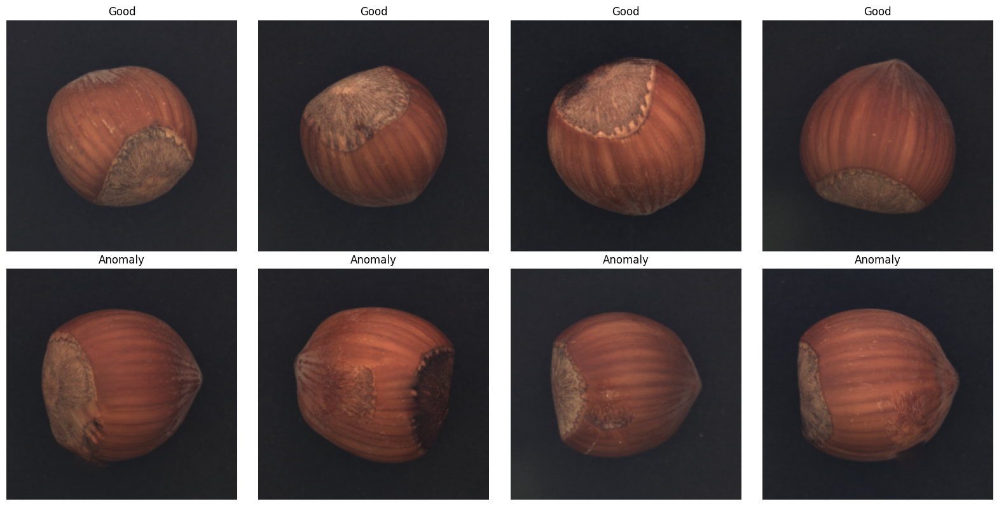

In [9]:
# Visualize some data from the dataset
plt.figure(figsize=(16, 8))
good_count = 0
anomaly_count = 0
max_display = 4
indices = np.random.choice(len(train_dataset), size=len(train_dataset), replace=False)
for i in indices:
    image, mask, label = train_dataset[i]
    if label == 0 and good_count < max_display:
        plt.subplot(2, 4, good_count + 1)
        plt.imshow(image.permute(1, 2, 0))
        plt.title('Good')
        plt.axis('off')
        good_count += 1
    elif label == 1 and anomaly_count < max_display:
        plt.subplot(2, 4, 4 + anomaly_count + 1)
        plt.imshow(image.permute(1, 2, 0))
        plt.title('Anomaly')
        plt.axis('off')
        anomaly_count += 1
    if good_count >= max_display and anomaly_count >= max_display:
        break
plt.tight_layout()
plt.show()

Model Class

In [10]:
class TransposeBasicBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(TransposeBasicBlock, self).__init__()
        self.conv1 = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=3, stride=2, padding=1, output_padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        
        self.upsample = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=1, stride=2, output_padding=1, bias=False),
            nn.BatchNorm2d(out_channels)
        )
    
    def forward(self, x):
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        
        out = self.conv2(out)
        out = self.bn2(out)

        # Perform upsampling path
        upsampled = self.upsample(x)

        return self.relu(out + upsampled)

class ResNetEncDec(nn.Module):
    def __init__(self):
        super(ResNetEncDec, self).__init__()

        # Encoder: Using ResNet layers up to layer4
        resnet = models.resnet18(pretrained=True)
        
        # Encoder layers
        self.conv1 = resnet.conv1
        self.bn1 = resnet.bn1
        self.relu = resnet.relu
        self.maxpool = resnet.maxpool
        self.layer1 = resnet.layer1
        self.layer2 = resnet.layer2
        self.layer3 = resnet.layer3
        self.layer4 = resnet.layer4

        # NIN layer (512 -> 256 -> 128)
        self.nin = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=1, stride=1, bias=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 128, kernel_size=1, stride=1, bias=False),
            nn.ReLU(inplace=True)
        )

        # Decoder (TransposeBasicBlock layers)
        self.uplayer1 = TransposeBasicBlock(128, 64)
        self.uplayer2 = TransposeBasicBlock(64, 32)
        self.uplayer3 = TransposeBasicBlock(32, 16)

        # Upsampling
        self.upsample = nn.Upsample(scale_factor=2.0, mode='bilinear')

        # Final conv layer
        self.convtranspose1 = nn.ConvTranspose2d(16, 1, kernel_size=7, stride=2, padding=3, output_padding=1, bias=False)

        # Final activation (Identity in this case)
        self.final_activation = nn.Identity()

        # Classification layer for image-level classification
        self.classifier = nn.Linear(128, 1)  # Binary classification (good vs anomaly)

    def forward(self, x):
        # Encoder
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        # NIN Layer
        x = self.nin(x)

        # Decoder layers
        decoded = self.uplayer1(x)
        decoded = self.uplayer2(decoded)
        decoded = self.uplayer3(decoded)

        # Upsample
        decoded = self.upsample(decoded)

        # Final convolution
        decoded = self.convtranspose1(decoded)

        # Final activation (here it's Identity)
        decoded = self.final_activation(decoded)

        # Image-level classification
        x = torch.mean(x, dim=[2, 3])  # Global Average Pooling
        class_output = self.classifier(x)
        class_output = torch.sigmoid(class_output)

        return decoded, class_output

In [11]:
# Define Model, Loss, and Optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ResNetEncDec().to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

/home/sameerhashmi36/miniconda3/envs/test/lib/python3.10/site-packages/torch/cuda/__init__.py:138: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:108.)
  return torch._C._cuda_getDeviceCount() > 0
/home/sameerhashmi36/miniconda3/envs/test/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/sameerhashmi36/miniconda3/envs/test/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`.

In [12]:
# Training Loop
num_epochs = 10
model.train()
for epoch in range(num_epochs):
    running_loss = 0.0
    for images, masks, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", leave=False):
        images, masks = images.to(device), masks.to(device)

        # Forward pass
        optimizer.zero_grad()
        outputs, _ = model(images)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}")

Epoch [1/10], Loss: 0.1452


Epoch [2/10], Loss: 0.0456


Epoch [3/10], Loss: 0.0366


Epoch [4/10], Loss: 0.0341


Epoch [5/10], Loss: 0.0328


Epoch [6/10], Loss: 0.0289


Epoch [7/10], Loss: 0.0299


Epoch [8/10], Loss: 0.0276


Epoch [9/10], Loss: 0.0252


Epoch [10/10], Loss: 0.0246


Image 1: Good


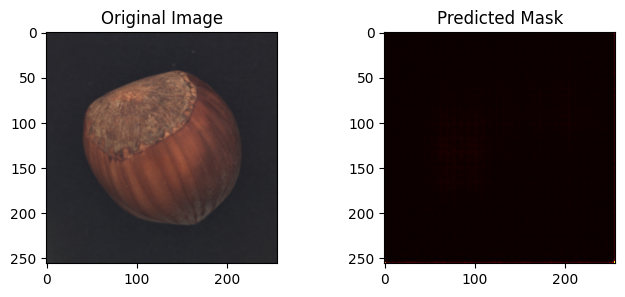

Image 2: Good


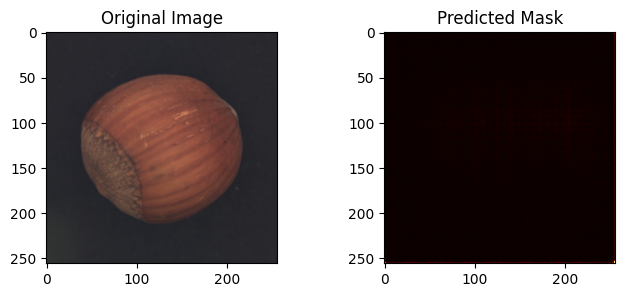

Image 3: Good


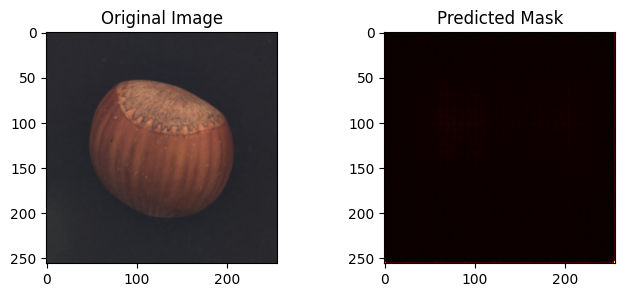

Image 4: Good


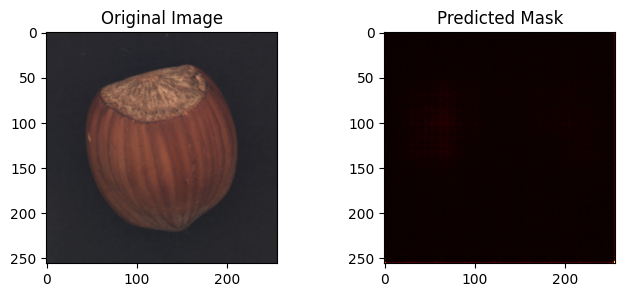

Image 5: Good


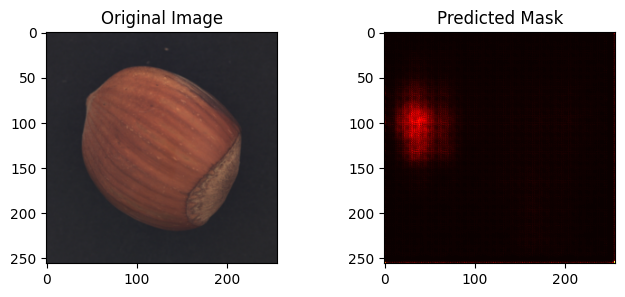

Image 6: Good


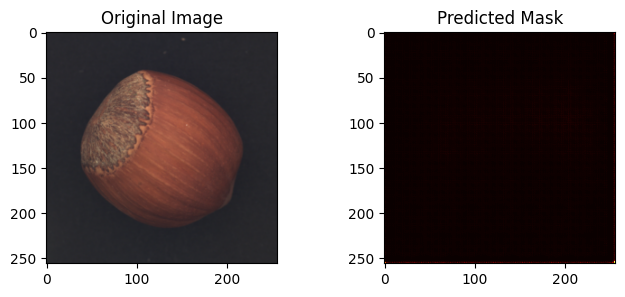

Image 7: Good


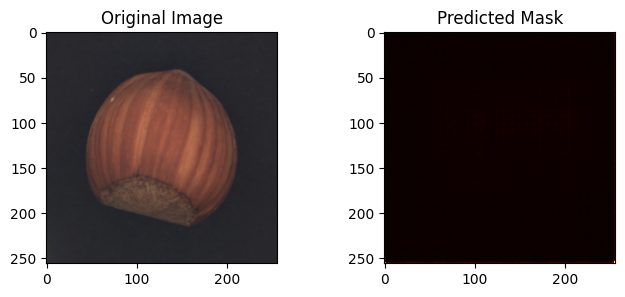

Image 8: Good


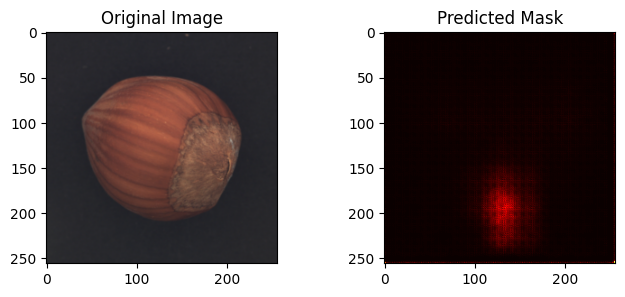

Image 1: Good


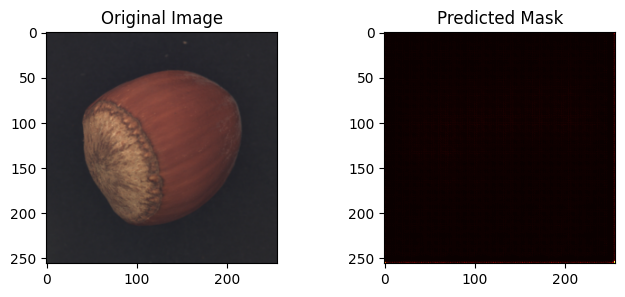

Image 2: Good


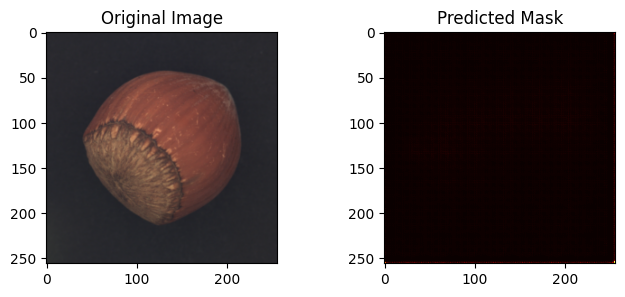

Image 3: Good


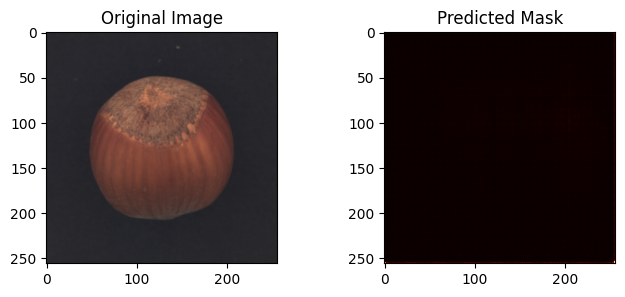

Image 4: Good


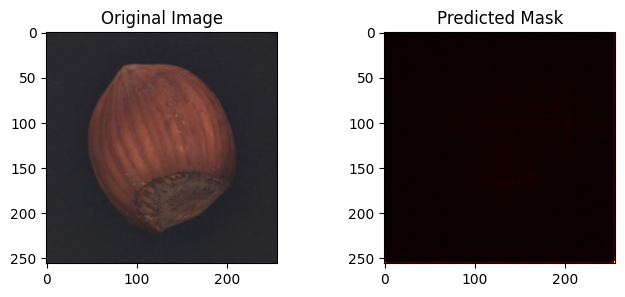

Image 5: Good


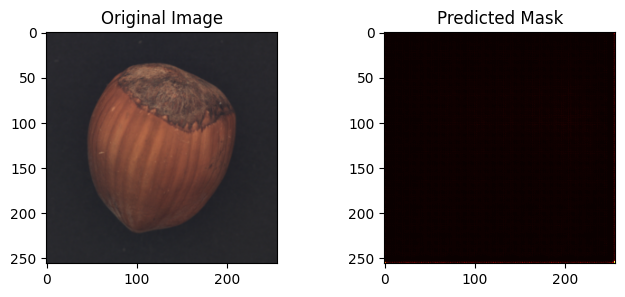

Image 6: Good


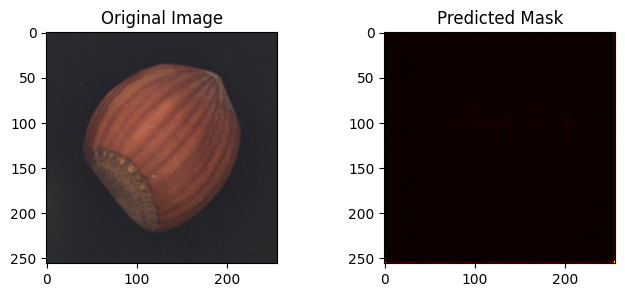

Image 7: Good


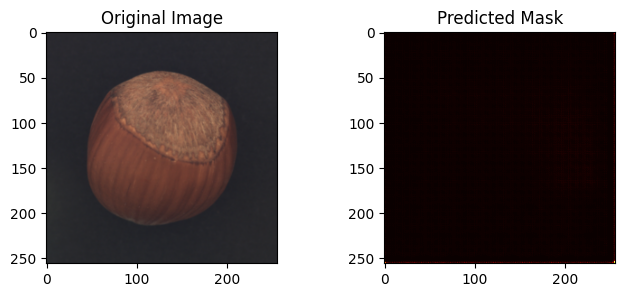

Image 8: Good


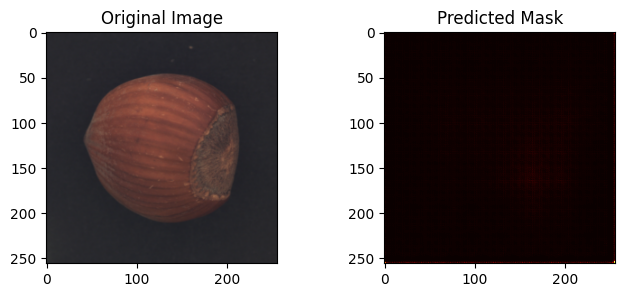

Image 1: Good


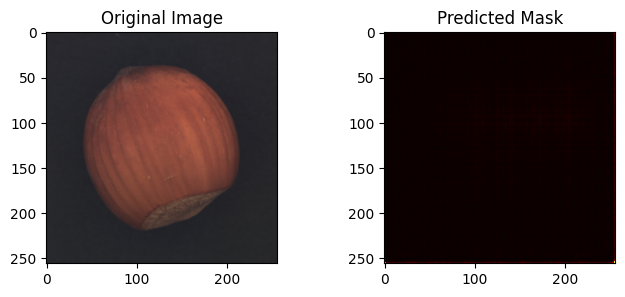

Image 2: Good


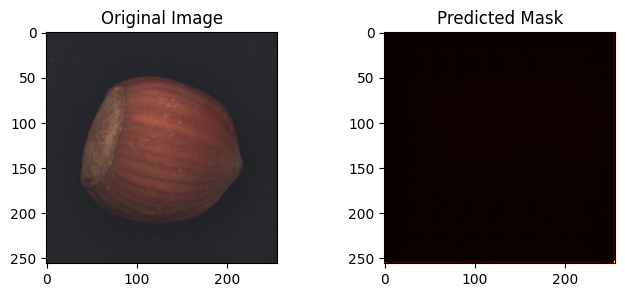

Image 3: Good


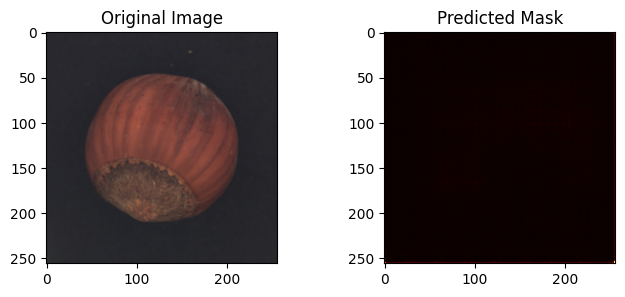

Image 4: Good


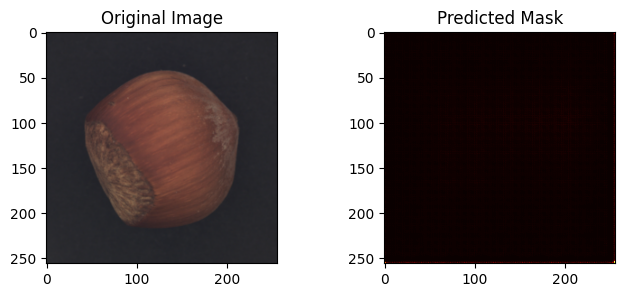

Image 5: Good


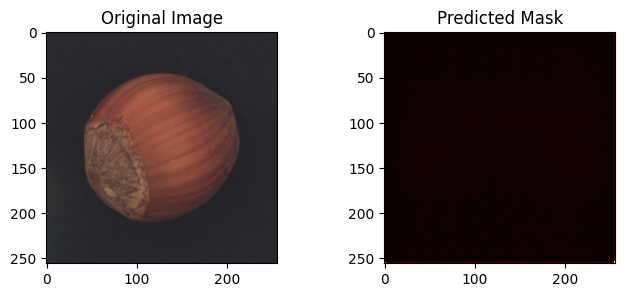

Image 6: Good


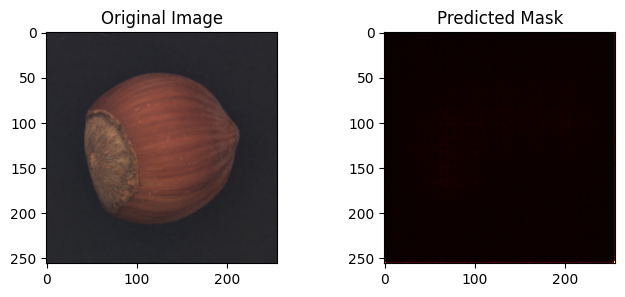

Image 7: Good


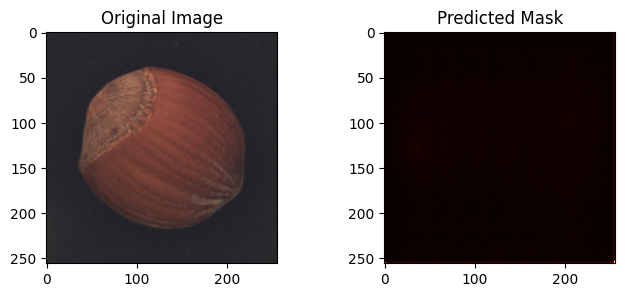

Image 8: Good


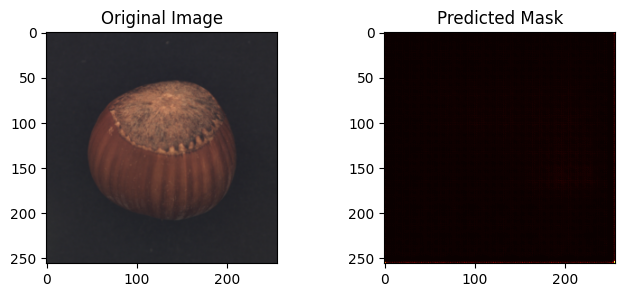

Image 1: Good


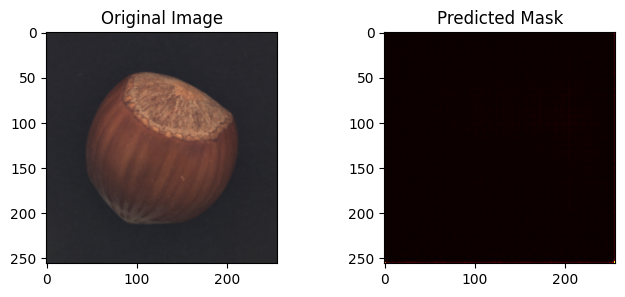

Image 2: Good


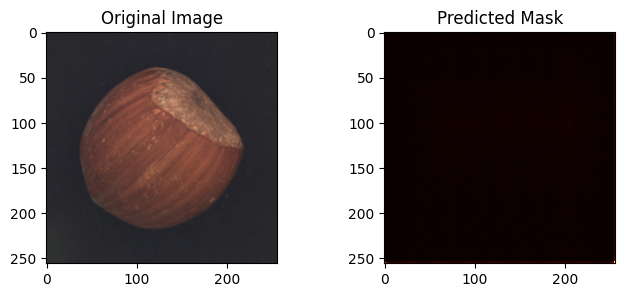

Image 3: Good


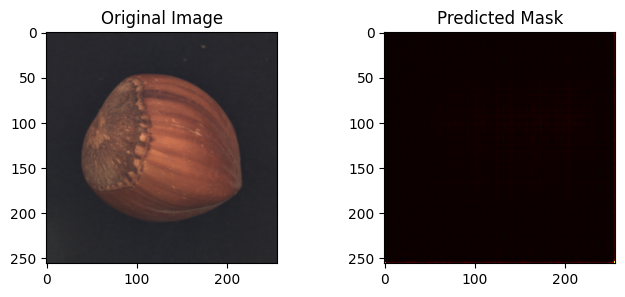

Image 4: Good


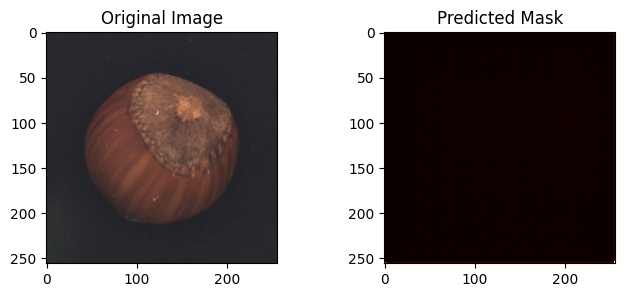

Image 5: Good


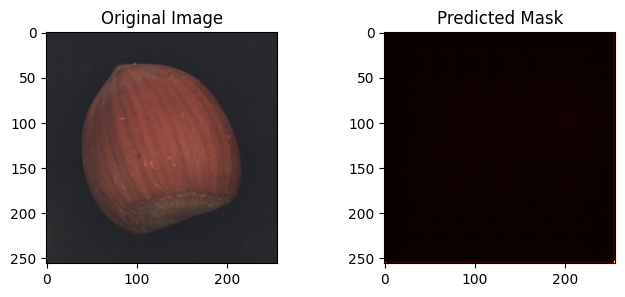

Image 6: Good


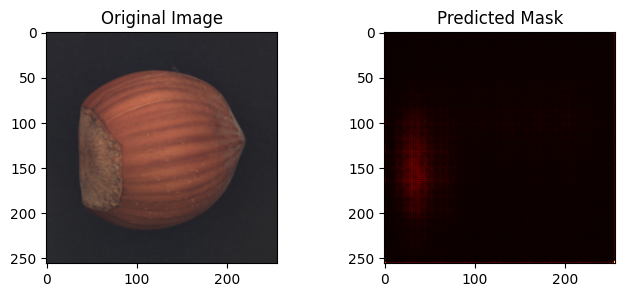

Image 7: Good


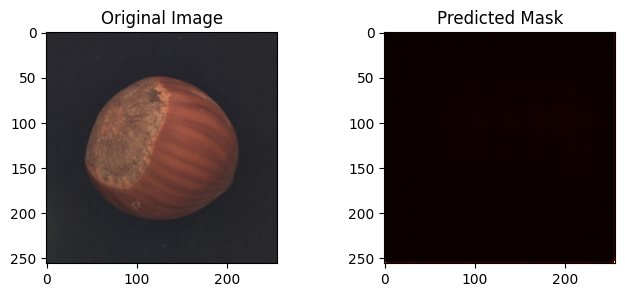

Image 8: Good


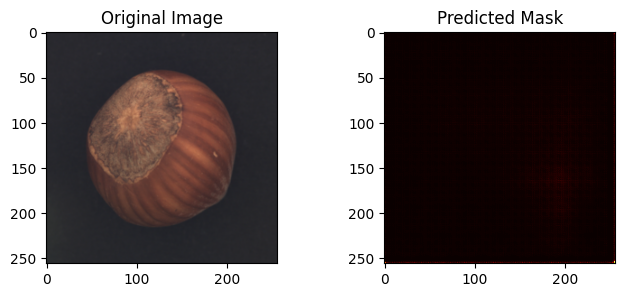

Image 1: Good


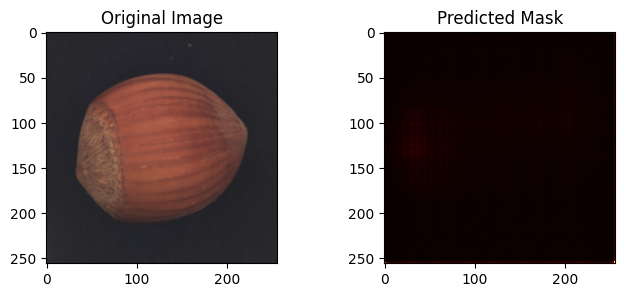

Image 2: Good


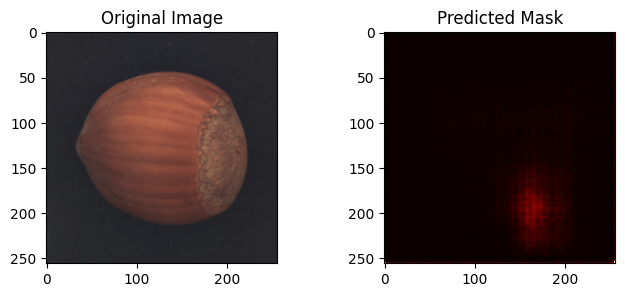

Image 3: Good


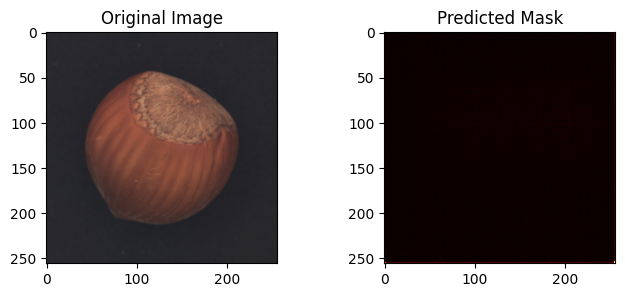

Image 4: Good


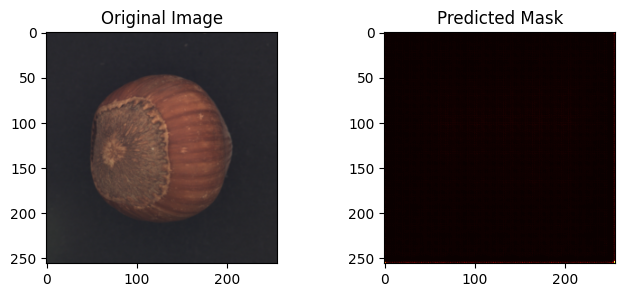

Image 5: Good


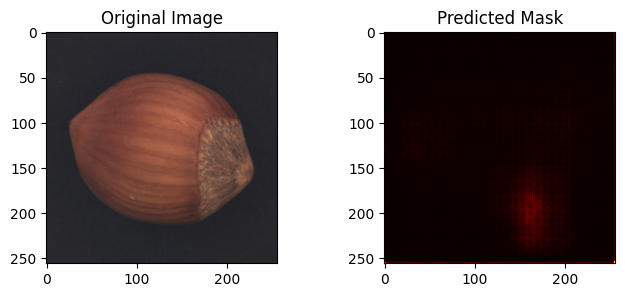

Image 6: Good


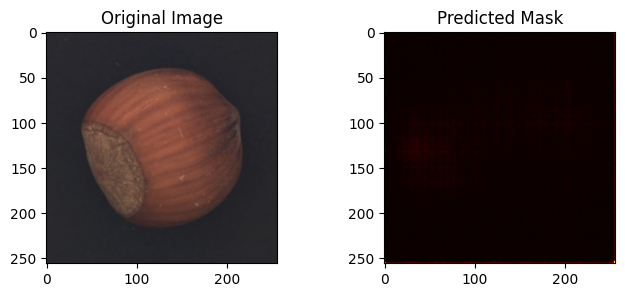

Image 7: Good


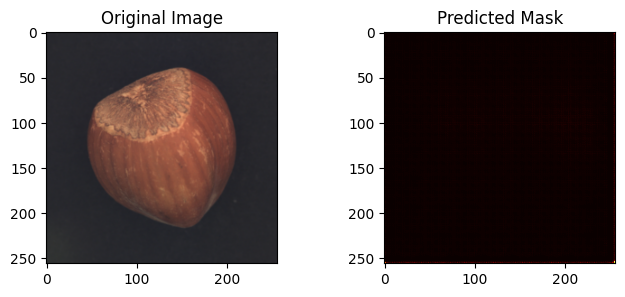

Image 8: Good


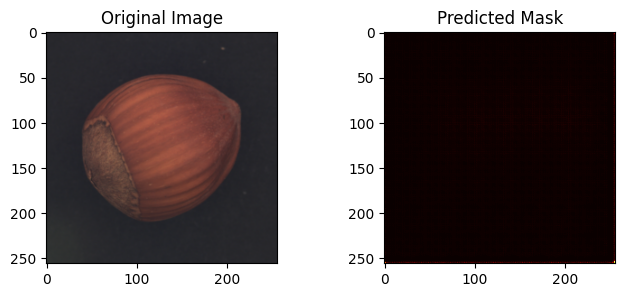

Image 1: Good


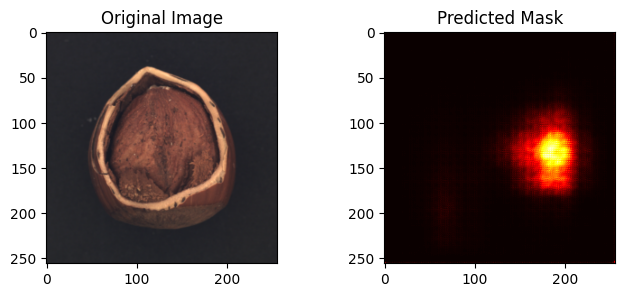

Image 2: Anomaly


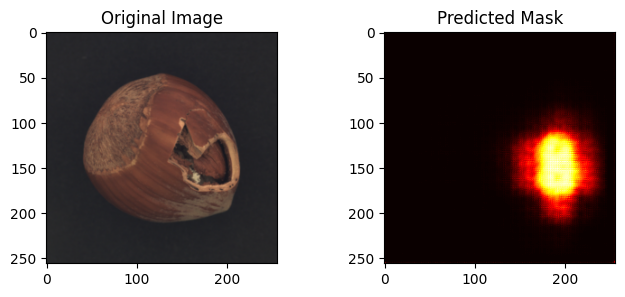

Image 3: Good


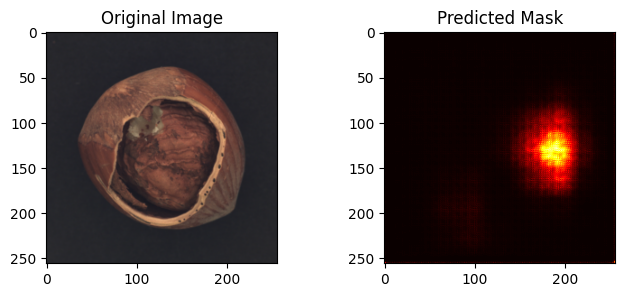

Image 4: Anomaly


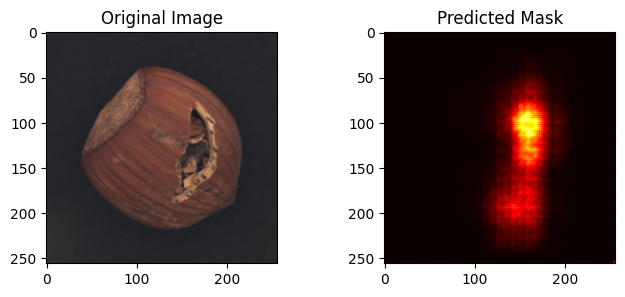

Image 5: Good


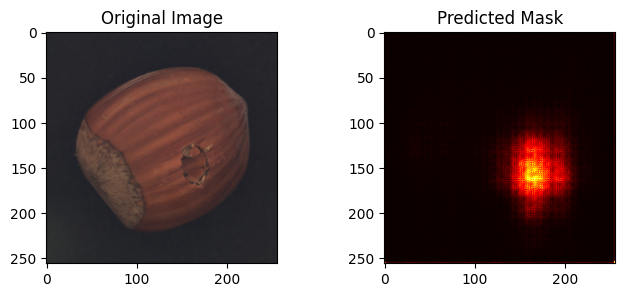

Image 6: Good


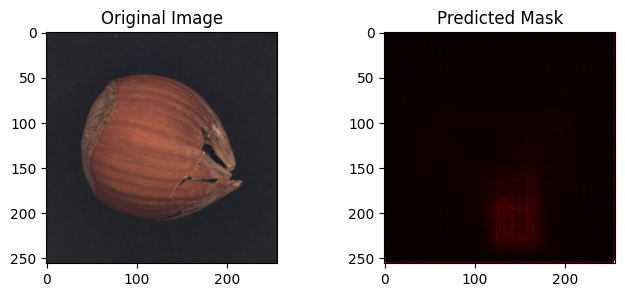

Image 7: Good


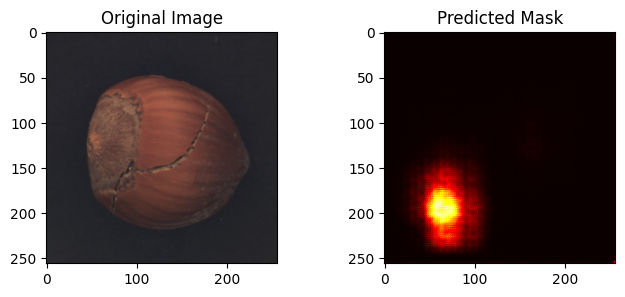

Image 8: Good


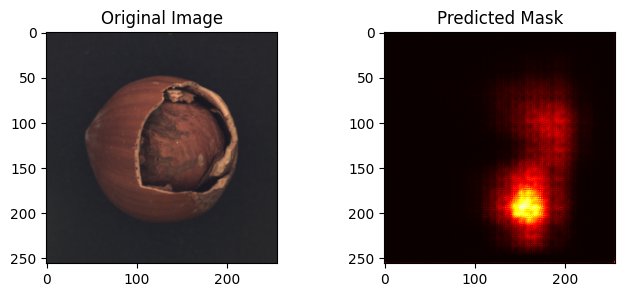

Image 1: Good


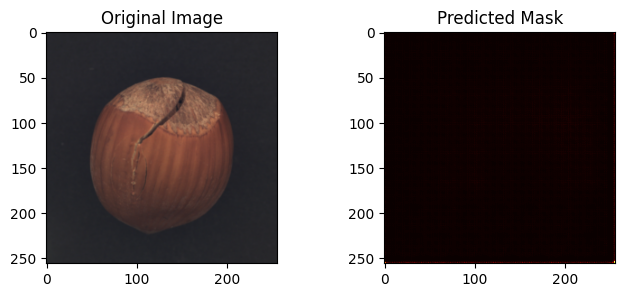

Image 2: Anomaly


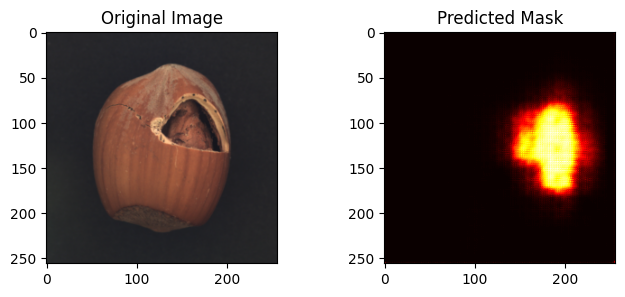

Image 3: Anomaly


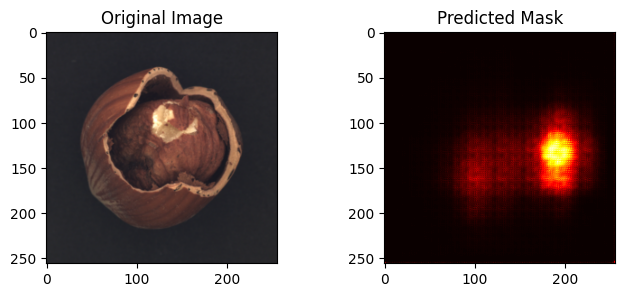

Image 4: Anomaly


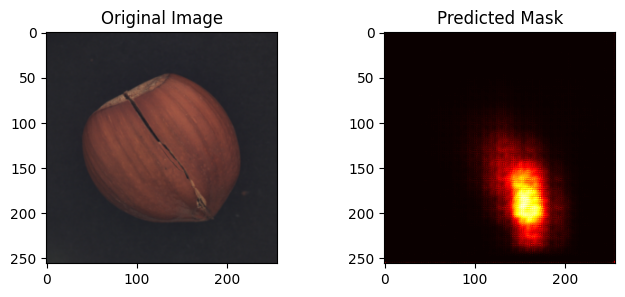

Image 5: Good


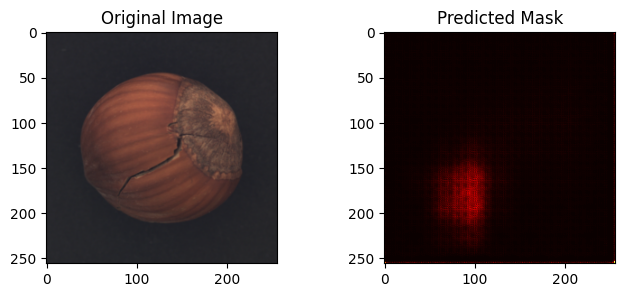

Image 6: Good


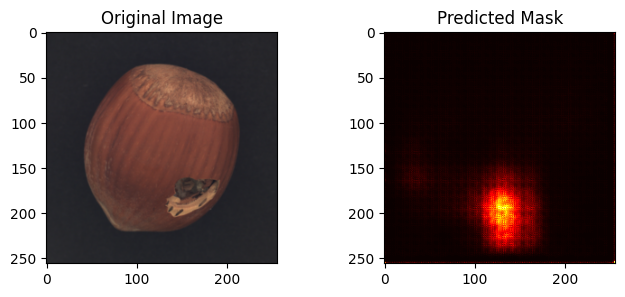

Image 7: Good


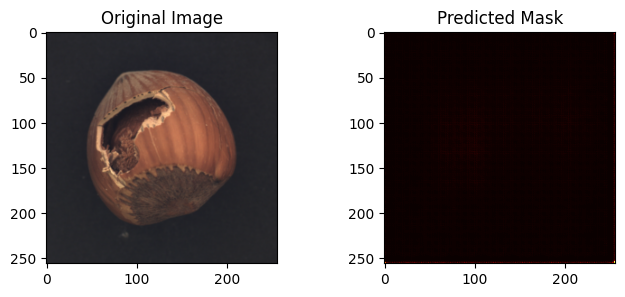

Image 8: Anomaly


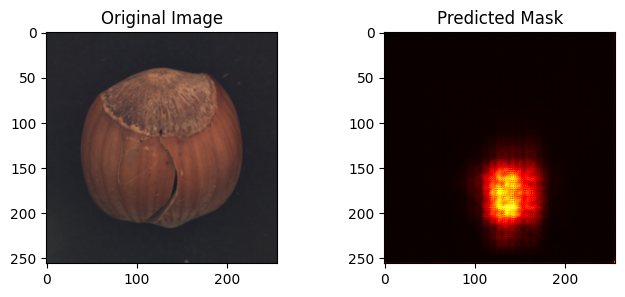

Image 1: Good


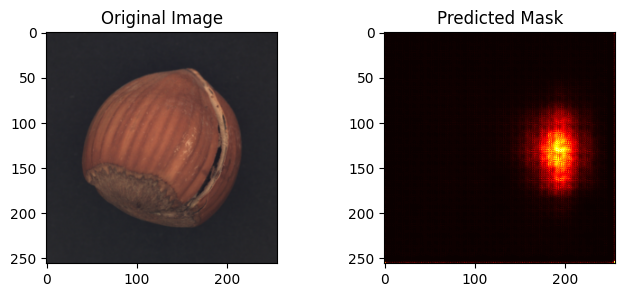

Image 2: Good


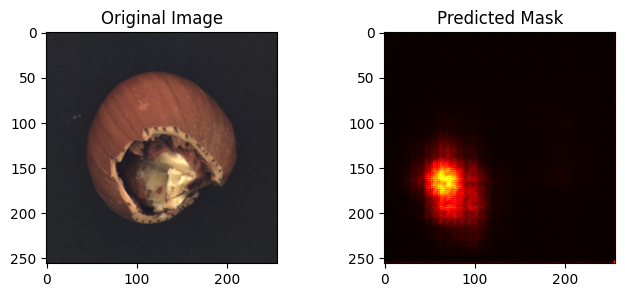

Image 3: Good


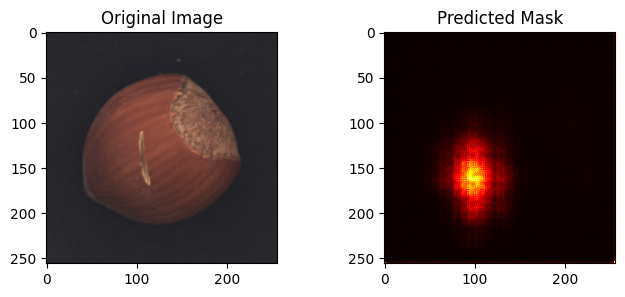

Image 4: Good


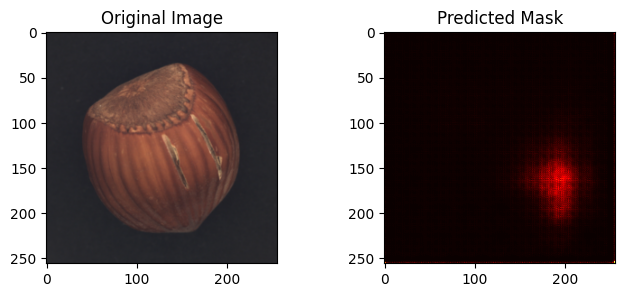

Image 5: Good


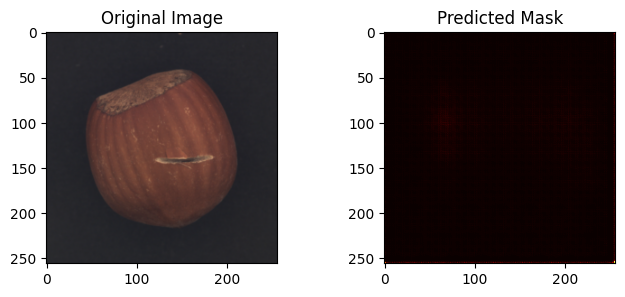

Image 6: Good


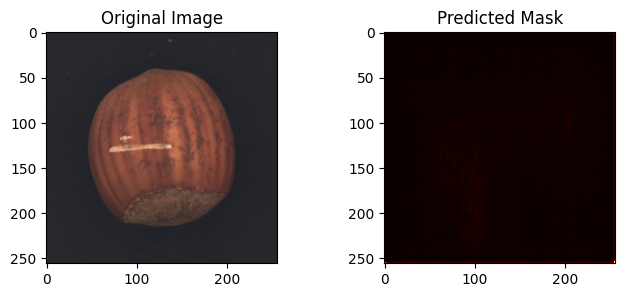

Image 7: Good


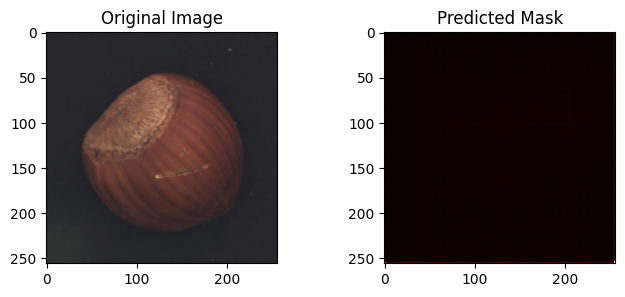

Image 8: Good


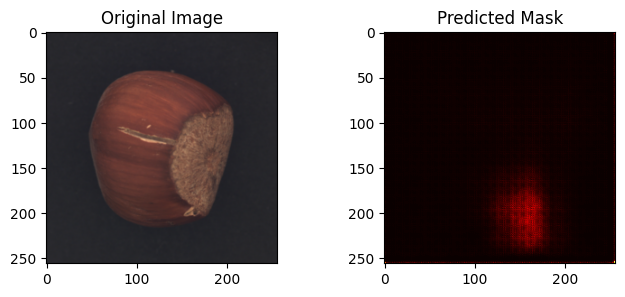

Image 1: Good


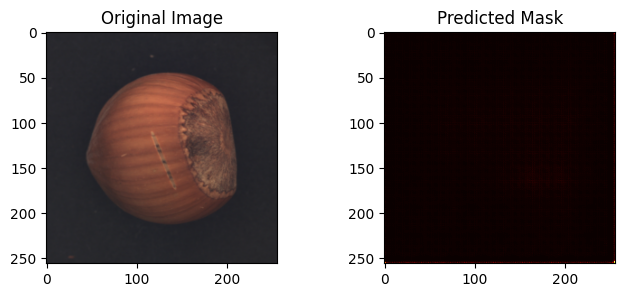

Image 2: Good


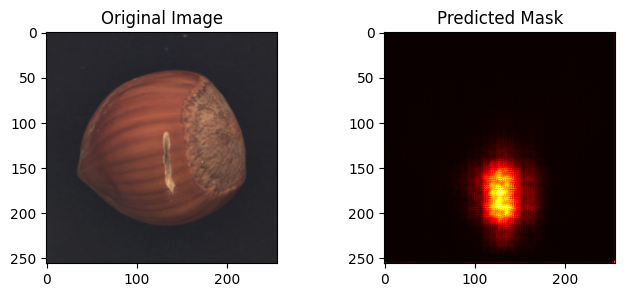

Image 3: Good


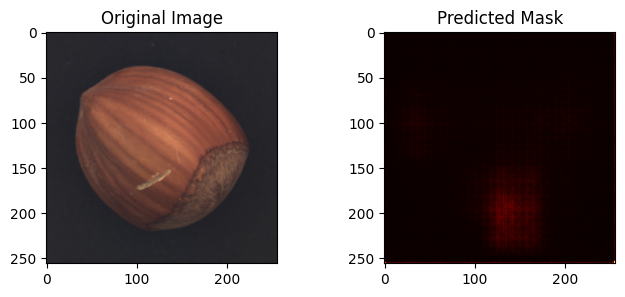

Image 4: Good


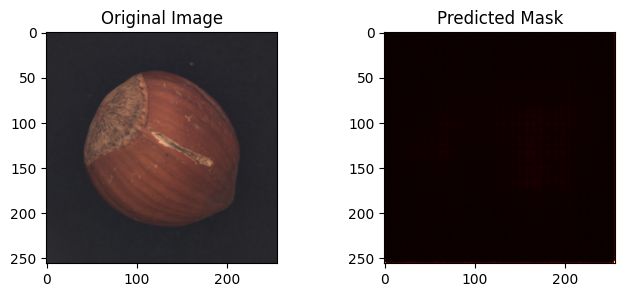

Image 5: Good


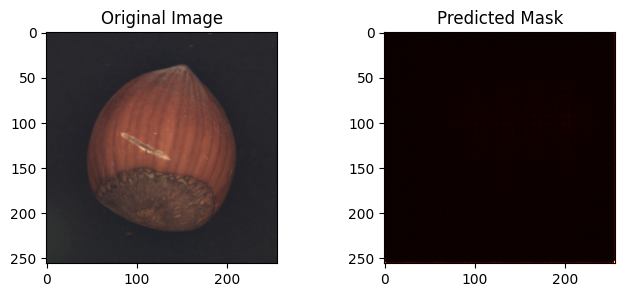

Image 6: Good


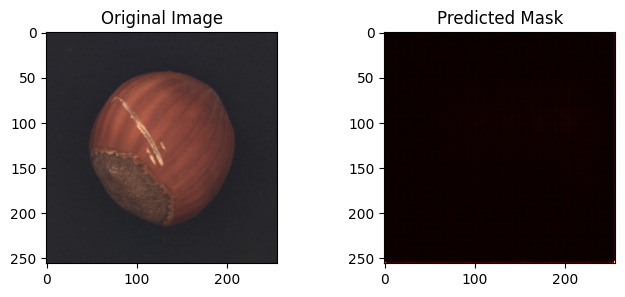

Image 7: Good


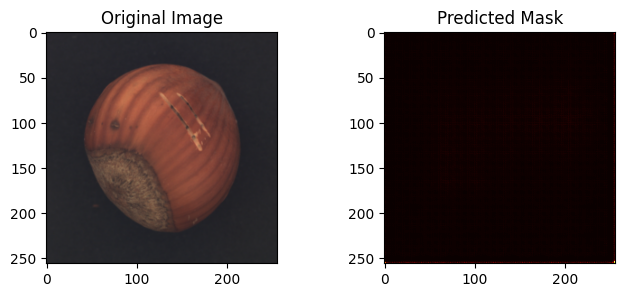

Image 8: Anomaly


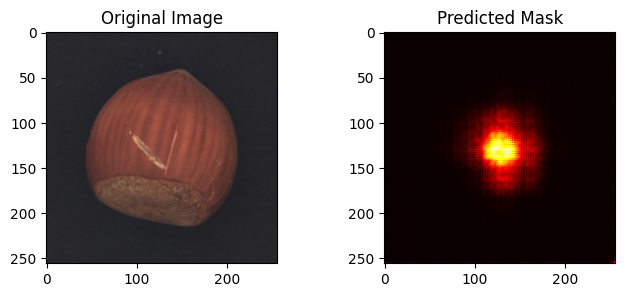

Image 1: Good


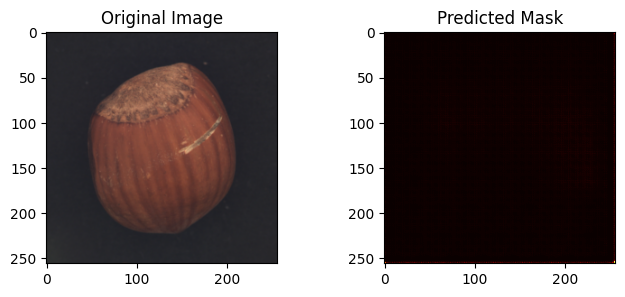

Image 2: Good


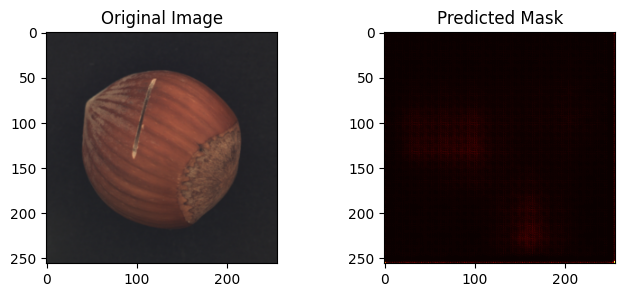

Image 3: Good


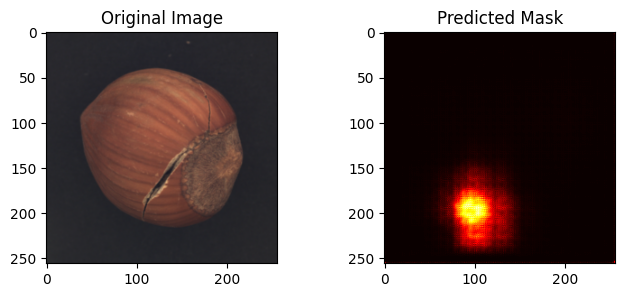

Image 4: Anomaly


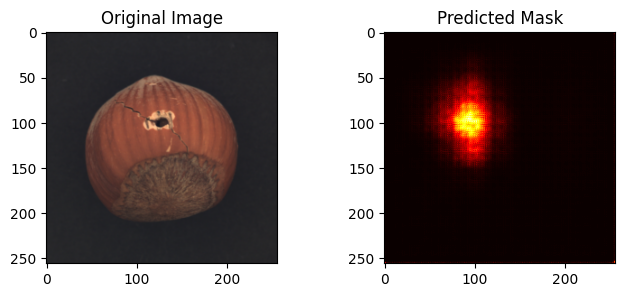

Image 5: Anomaly


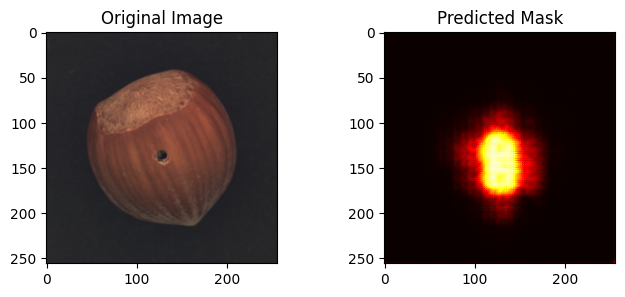

Image 6: Good


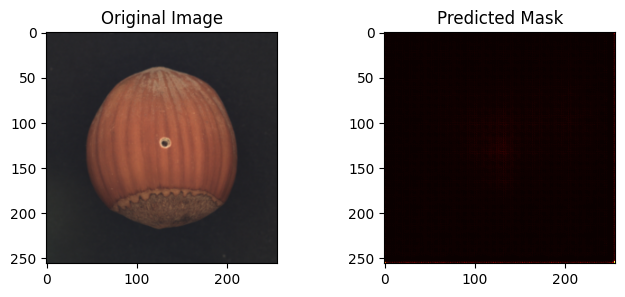

Image 7: Anomaly


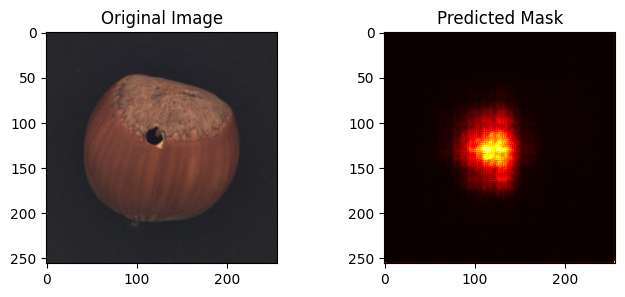

Image 8: Anomaly


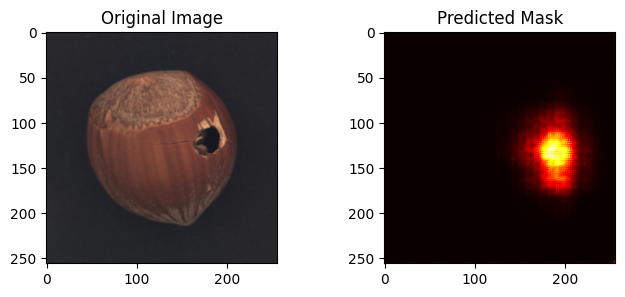

Image 1: Good


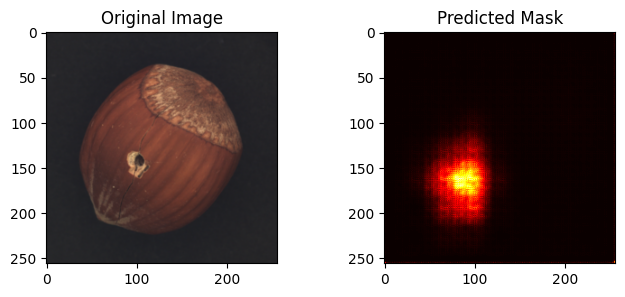

Image 2: Good


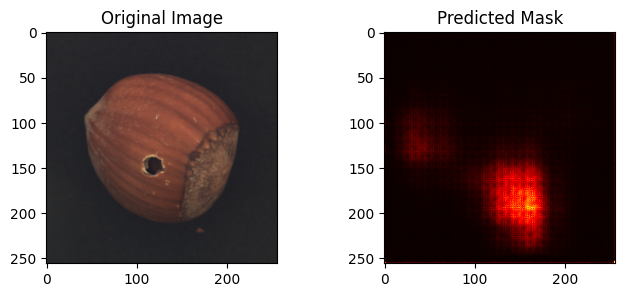

Image 3: Good


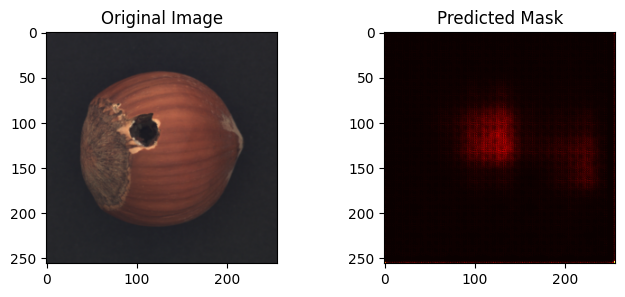

Image 4: Good


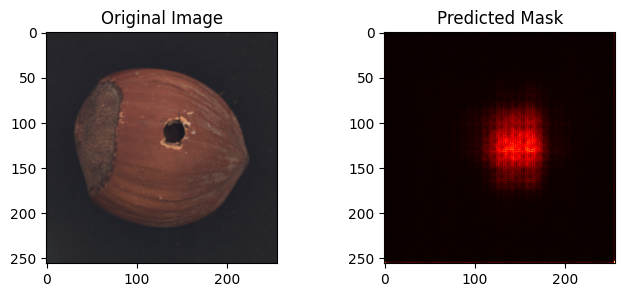

Image 5: Good


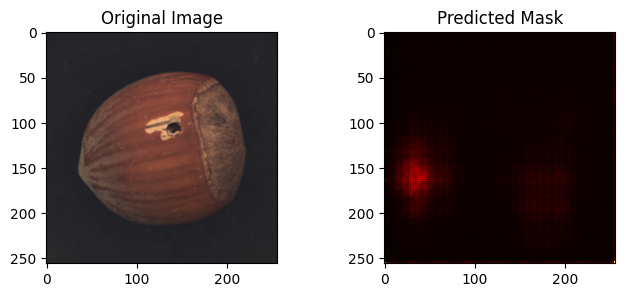

Image 6: Good


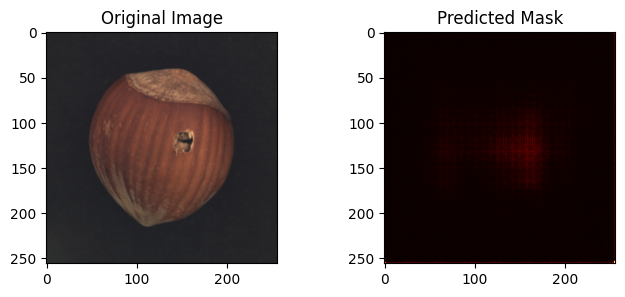

Image 7: Anomaly


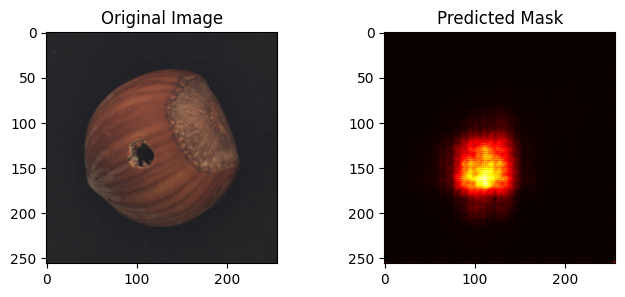

Image 8: Good


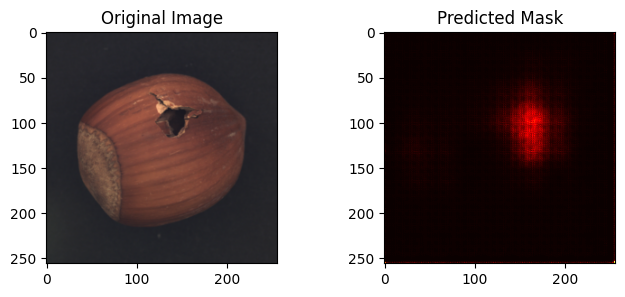

Image 1: Anomaly


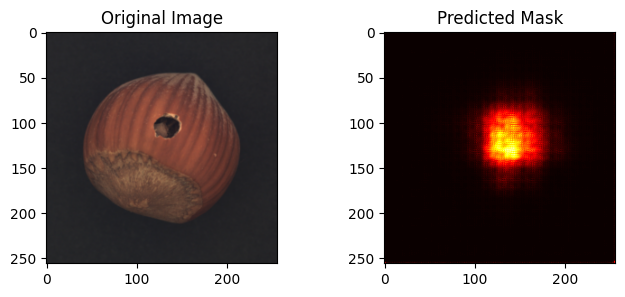

Image 2: Good


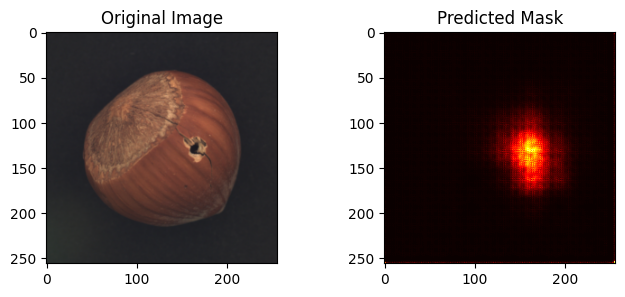

Image 3: Good


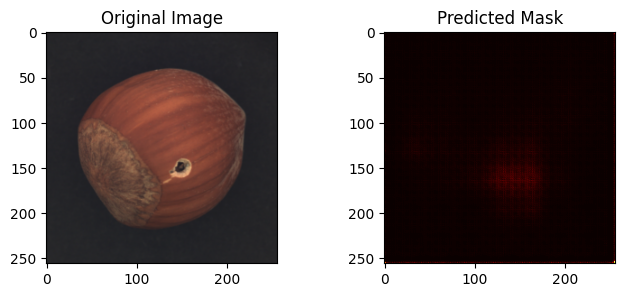

Image 4: Good


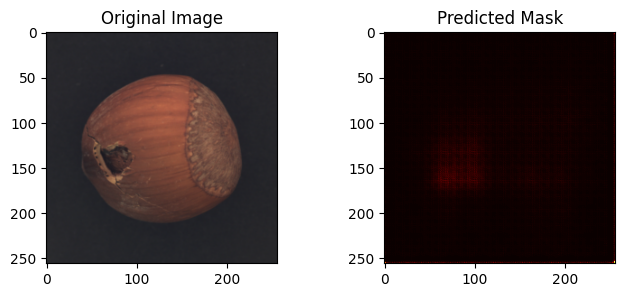

Image 5: Good


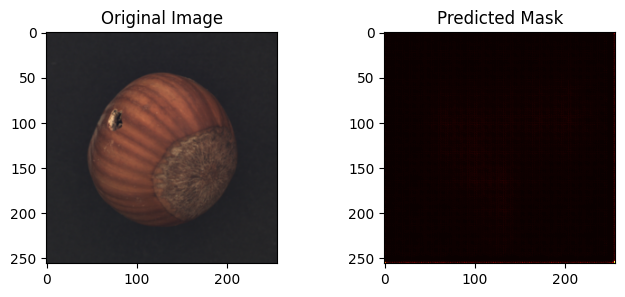

Image 6: Good


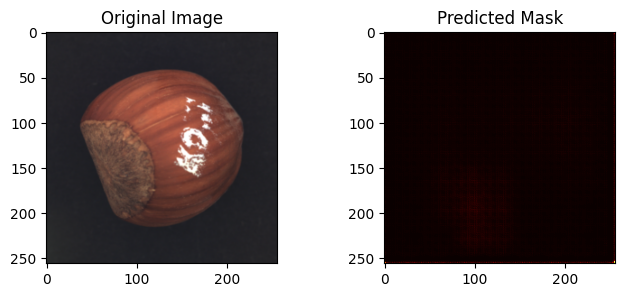

Image 7: Good


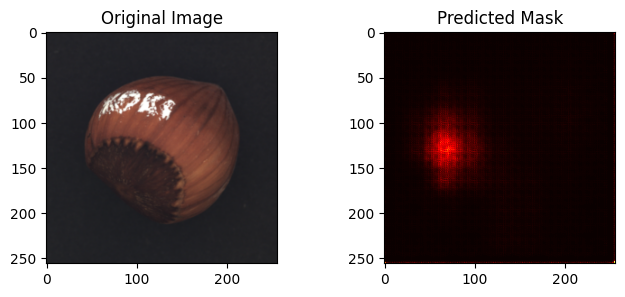

Image 8: Good


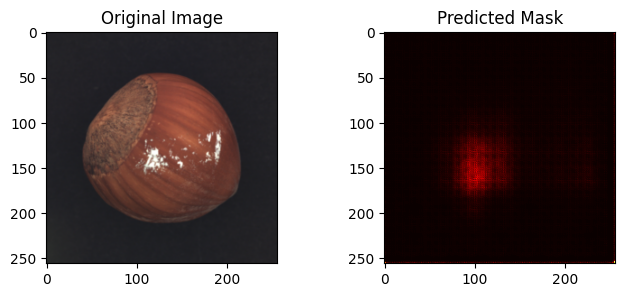

Image 1: Good


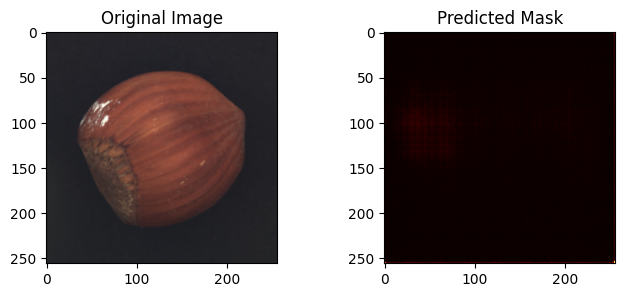

Image 2: Good


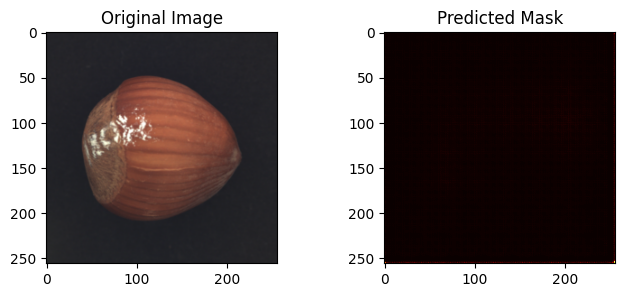

Image 3: Good


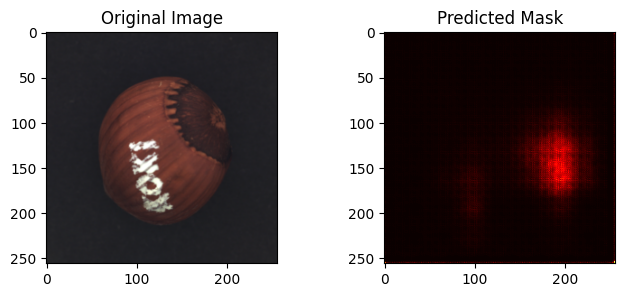

Image 4: Good


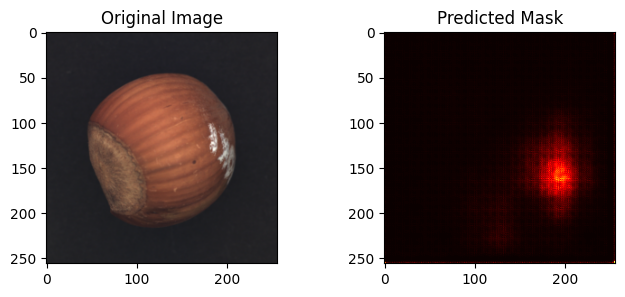

Image 5: Good


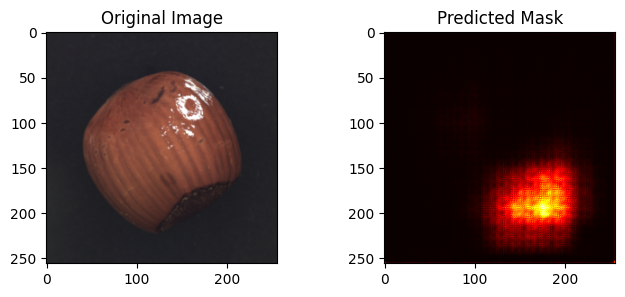

Image 6: Good


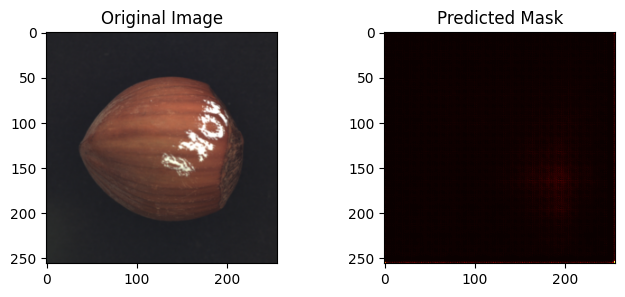

Image 7: Good


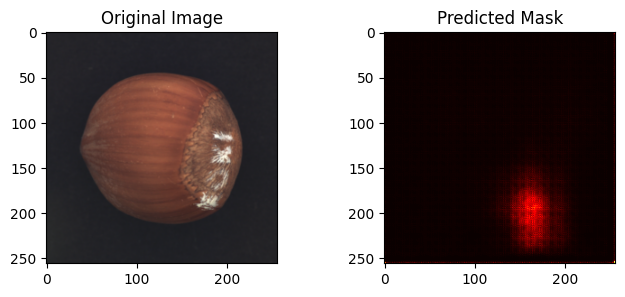

Image 8: Good


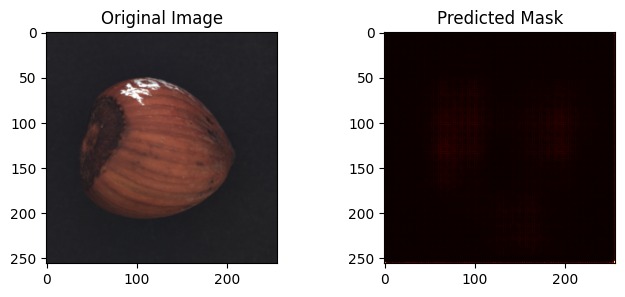

Image 1: Good


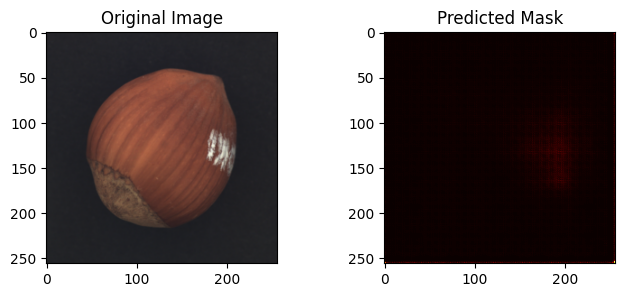

Image 2: Good


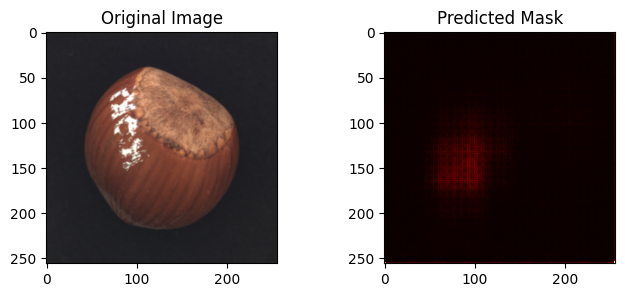

Image 3: Good


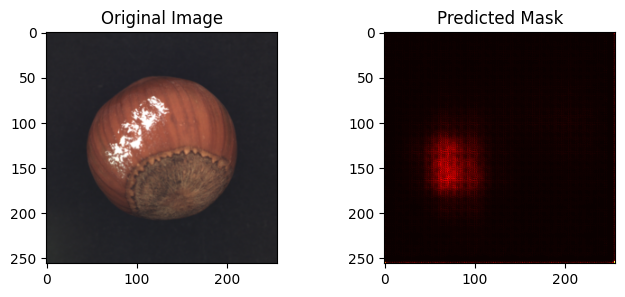

Image 4: Good


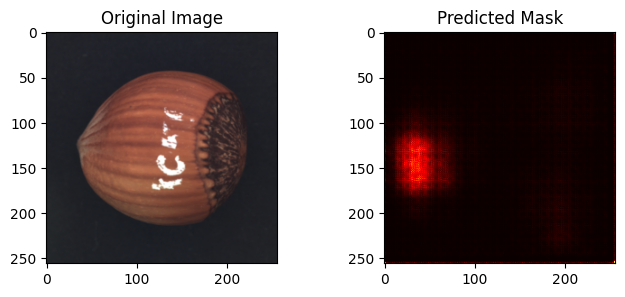

Image 5: Good


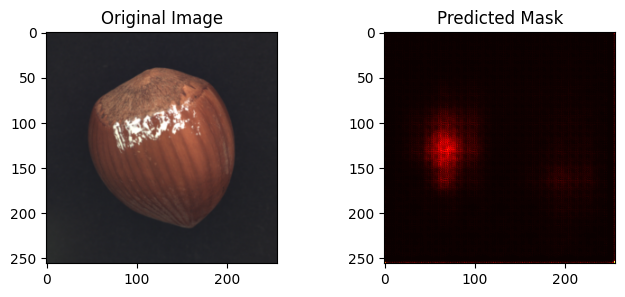

Image 6: Good


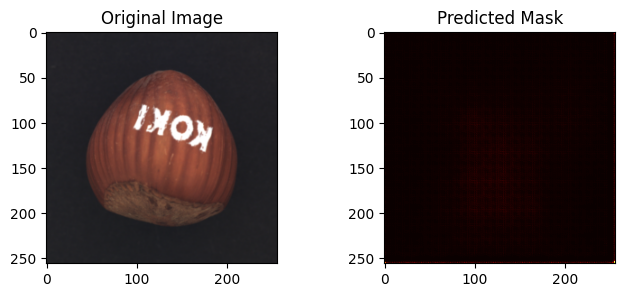

In [29]:
model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        
        # Pixel-level prediction
        decoded, class_output = model(images)
        decoded = torch.sigmoid(decoded)  # Apply sigmoid to get probabilities
        class_output = torch.sigmoid(class_output)  # Apply sigmoid for binary classification

        # Move tensors to CPU for visualization
        images = images.cpu()
        decoded = decoded.cpu()
        class_output = class_output.cpu()
        
        # Visualize results
        for i in range(len(images)):
            plt.figure(figsize=(8, 3))  # Smaller figure size for each image
            plt.subplot(1, 2, 1)
            plt.title("Original Image")
            plt.imshow(images[i].permute(1, 2, 0))
            
            plt.subplot(1, 2, 2)
            plt.title("Predicted Mask")
            plt.imshow(decoded[i].squeeze(), cmap='hot')
            
            # Determine and display the classification result
            is_anomaly = "Anomaly" if class_output[i].item() > 0.7 else "Good"
            print(f"Image {i+1}: {is_anomaly}")
            
            plt.show()


Image 1: Anomaly Score = 0.6958, Predicted = Good, Label = Good
Image 2: Anomaly Score = 0.6942, Predicted = Good, Label = Good
Image 3: Anomaly Score = 0.6948, Predicted = Good, Label = Good
Image 4: Anomaly Score = 0.6936, Predicted = Good, Label = Good
Image 5: Anomaly Score = 0.6904, Predicted = Good, Label = Good
Image 6: Anomaly Score = 0.6965, Predicted = Good, Label = Good
Image 7: Anomaly Score = 0.6945, Predicted = Good, Label = Good
Image 8: Anomaly Score = 0.6934, Predicted = Good, Label = Good
Image 9: Anomaly Score = 0.6952, Predicted = Good, Label = Good
Image 10: Anomaly Score = 0.6937, Predicted = Good, Label = Good
Image 11: Anomaly Score = 0.6971, Predicted = Good, Label = Good
Image 12: Anomaly Score = 0.6961, Predicted = Good, Label = Good
Image 13: Anomaly Score = 0.6966, Predicted = Good, Label = Good
Image 14: Anomaly Score = 0.6949, Predicted = Good, Label = Good
Image 15: Anomaly Score = 0.6975, Predicted = Good, Label = Good
Image 16: Anomaly Score = 0.6939, 

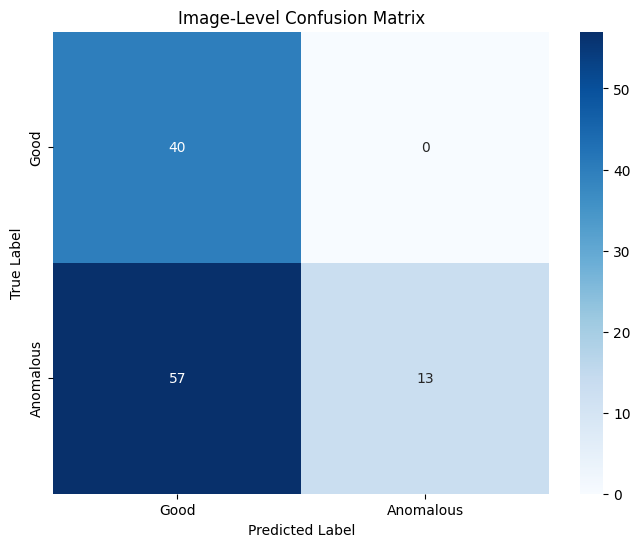

In [34]:
# Define the threshold for classifying an image as anomalous based on the image-level output
anomaly_threshold = 0.7

model.eval()

image_preds = []
image_labels = []

# Map class folders to labels
class_mapping = {'good': 0, 'crack': 1, 'cut': 1, 'hole': 1, 'print': 1}

with torch.no_grad():
    count = 0
    for images, labels in test_loader:
        images = images.to(device)
        
        decoded, class_output = model(images)
        class_output = torch.sigmoid(class_output) 
        
        # Process each image in the batch
        for i in range(images.size(0)):
            
            is_anomaly = 1 if class_output[i].item() > anomaly_threshold else 0
            
            image_preds.append(is_anomaly)
            image_labels.append(labels[i].item())  # Assume labels are provided in the loader
            
            count += 1
            # Print each prediction, label, and anomaly score for debugging
            print(f"Image {count}: Anomaly Score = {class_output[i].item():.4f}, Predicted = {'Anomaly' if is_anomaly else 'Good'}, Label = {'Anomaly' if labels[i].item() == 1 else 'Good'}")

# Calculate confusion matrix
conf_matrix = confusion_matrix(image_labels, image_preds)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Good", "Anomalous"], yticklabels=["Good", "Anomalous"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Image-Level Confusion Matrix")
plt.show()

In [35]:
# Set model to evaluation mode
model.eval()

# Initialize lists to store image-level anomaly scores for each class
anomaly_scores_good = []
anomaly_scores_anomalous = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        
        # Forward pass for image-level prediction
        _, class_output = model(images)
        class_output = torch.sigmoid(class_output)  # Convert logits to probabilities
        
        # Collect anomaly scores by class
        for i in range(images.size(0)):
            score = class_output[i].item()
            if labels[i].item() == 0:  # Good images
                anomaly_scores_good.append(score)
            else:  # Anomalous images
                anomaly_scores_anomalous.append(score)

# Calculate average and other statistics for both classes
avg_score_good = np.mean(anomaly_scores_good)
avg_score_anomalous = np.mean(anomaly_scores_anomalous)
median_score_good = np.median(anomaly_scores_good)
median_score_anomalous = np.median(anomaly_scores_anomalous)

# Print out statistics
print("Statistics for setting the threshold:")
print(f"Average anomaly score for Good images: {avg_score_good:.4f}")
print(f"Average anomaly score for Anomalous images: {avg_score_anomalous:.4f}")
print(f"Median anomaly score for Good images: {median_score_good:.4f}")
print(f"Median anomaly score for Anomalous images: {median_score_anomalous:.4f}")

# Suggest a potential threshold based on the averages
suggested_threshold = (avg_score_good + avg_score_anomalous) / 2
print(f"Suggested threshold based on average scores: {suggested_threshold:.4f}")

Statistics for setting the threshold:
Average anomaly score for Good images: 0.6946
Average anomaly score for Anomalous images: 0.6963
Median anomaly score for Good images: 0.6946
Median anomaly score for Anomalous images: 0.6959
Suggested threshold based on average scores: 0.6954
